# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

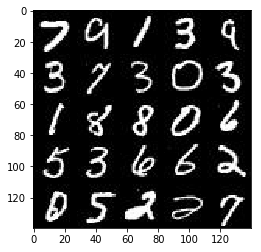

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

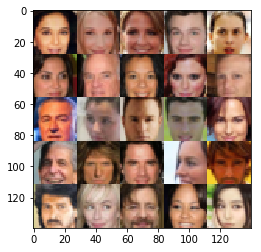

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    inputs_lr = tf.placeholder(tf.float32, name='input_lr')

    return inputs_real, inputs_z, inputs_lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x[1 or 3]
        
        x1 = tf.layers.conv2d(images, 128, 5, strides=1, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        # 28x28x128
        
        x2 = tf.layers.conv2d(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256
        
        x3 = tf.layers.conv2d(x2, 512, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        # 7x7x512

        # Flatten it
        flat = tf.reshape(x3, (-1, 7*7*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.2
    with tf.variable_scope('generator', reuse = not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.nn.relu(x1)
        # 7x7x256 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.nn.relu(x2)
        # 14x14x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 28x28x64
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
        # 28x28xout_channel_dim now
        
        out = 0.5 * tf.tanh(logits)
        
        return out    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake) * 0.9))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    return d_train_opt, g_train_opt    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [ ]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #tf.reset_default_graph()

    data_channels = data_shape[3]
    
    print_every=100
    show_every=100
    
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)   
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Processed {}: ".format(steps * batch_size),
                          "Discriminator Loss: {:.4f}, ".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_channels, data_image_mode)
                
                steps = steps + 1


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Processed 0:  Discriminator Loss: 7.3271,  Generator Loss: 0.7335


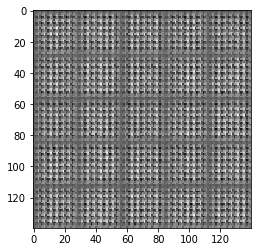

Processed 10000:  Discriminator Loss: 1.0287,  Generator Loss: 1.6233


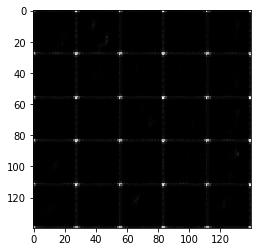

Processed 20000:  Discriminator Loss: 1.5548,  Generator Loss: 0.6321


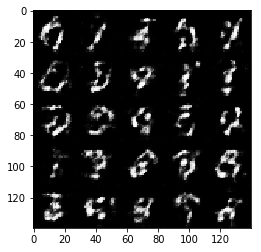

Processed 30000:  Discriminator Loss: 1.5289,  Generator Loss: 0.7509


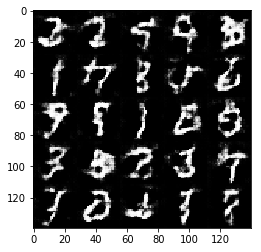

Processed 40000:  Discriminator Loss: 1.4093,  Generator Loss: 0.6409


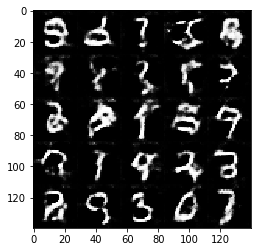

Processed 50000:  Discriminator Loss: 1.3641,  Generator Loss: 0.5194


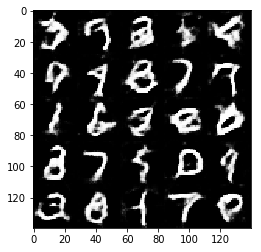

Processed 60000:  Discriminator Loss: 1.3883,  Generator Loss: 0.5168


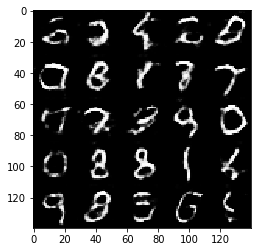

Processed 70000:  Discriminator Loss: 2.2647,  Generator Loss: 1.8694


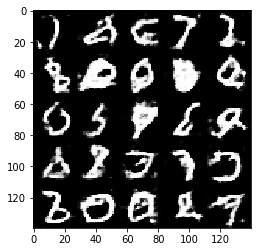

Processed 80000:  Discriminator Loss: 1.4736,  Generator Loss: 0.4397


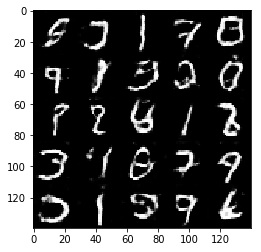

Processed 90000:  Discriminator Loss: 1.6133,  Generator Loss: 0.4114


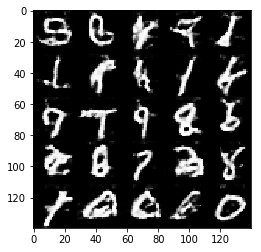

Processed 100000:  Discriminator Loss: 1.5691,  Generator Loss: 0.4242


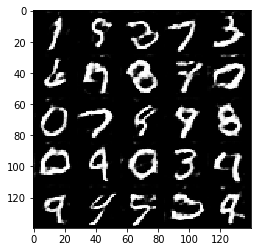

Processed 110000:  Discriminator Loss: 1.2033,  Generator Loss: 0.7309


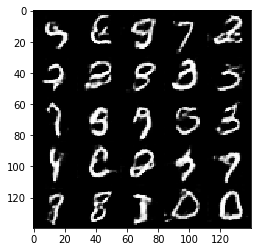

Processed 120000:  Discriminator Loss: 1.2894,  Generator Loss: 0.6774


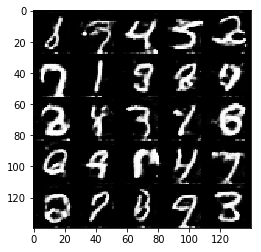

Processed 130000:  Discriminator Loss: 1.3194,  Generator Loss: 0.5893


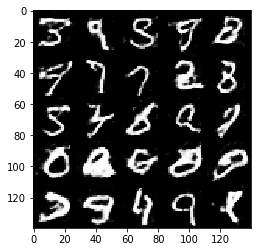

Processed 140000:  Discriminator Loss: 1.3200,  Generator Loss: 0.5531


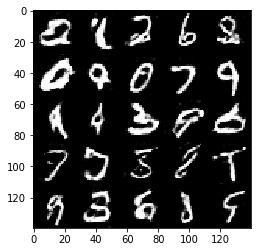

Processed 150000:  Discriminator Loss: 1.1309,  Generator Loss: 0.8947


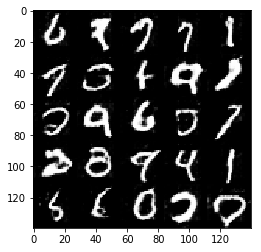

Processed 160000:  Discriminator Loss: 1.2196,  Generator Loss: 0.8014


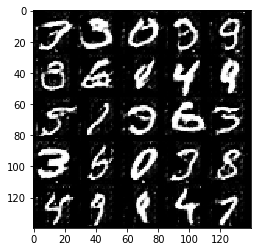

Processed 170000:  Discriminator Loss: 1.6640,  Generator Loss: 1.7024


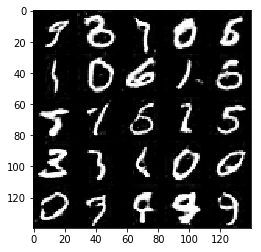

Processed 180000:  Discriminator Loss: 1.6157,  Generator Loss: 0.4479


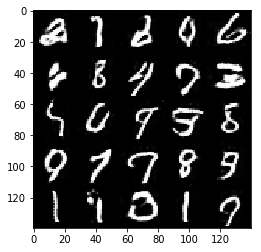

Processed 190000:  Discriminator Loss: 1.3042,  Generator Loss: 0.9177


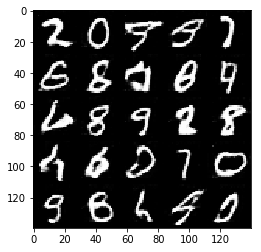

Processed 200000:  Discriminator Loss: 1.3214,  Generator Loss: 0.6406


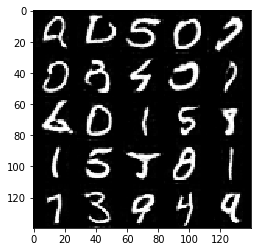

Processed 210000:  Discriminator Loss: 1.2548,  Generator Loss: 0.7498


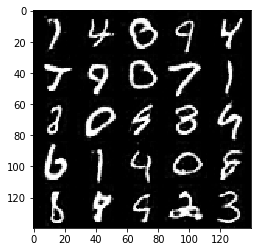

Processed 220000:  Discriminator Loss: 1.5153,  Generator Loss: 0.5344


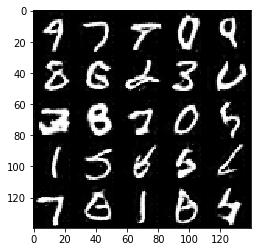

Processed 230000:  Discriminator Loss: 1.6293,  Generator Loss: 0.4703


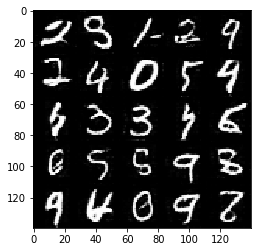

In [ ]:
batch_size = 100
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 4

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, 
          batch_size, 
          z_dim, 
          learning_rate, 
          beta1, 
          mnist_dataset.get_batches,
          mnist_dataset.shape, 
          mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Processed 0:  Discriminator Loss: 3.5977,  Generator Loss: 0.3876


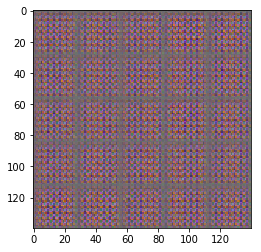

Processed 10000:  Discriminator Loss: 2.5053,  Generator Loss: 2.4697


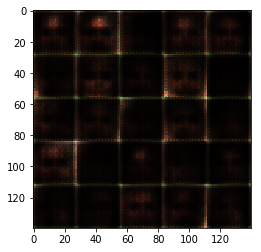

Processed 20000:  Discriminator Loss: 0.8464,  Generator Loss: 2.3032


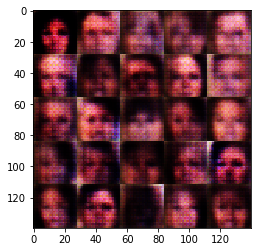

Processed 30000:  Discriminator Loss: 1.1383,  Generator Loss: 1.3432


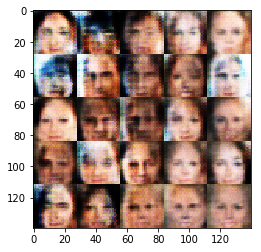

Processed 40000:  Discriminator Loss: 1.4319,  Generator Loss: 0.9339


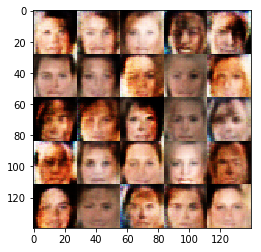

Processed 50000:  Discriminator Loss: 1.3477,  Generator Loss: 0.4866


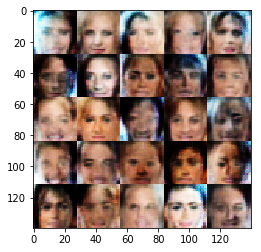

Processed 60000:  Discriminator Loss: 0.4390,  Generator Loss: 1.4293


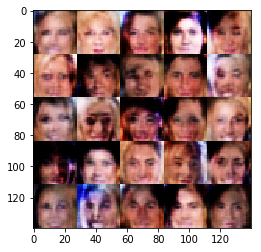

Processed 70000:  Discriminator Loss: 0.3295,  Generator Loss: 2.3935


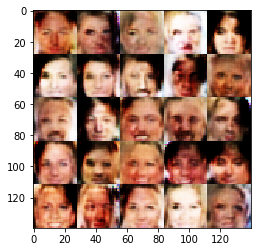

Processed 80000:  Discriminator Loss: 1.0235,  Generator Loss: 2.3137


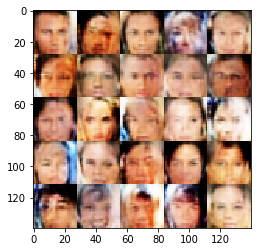

Processed 90000:  Discriminator Loss: 1.6317,  Generator Loss: 0.5235


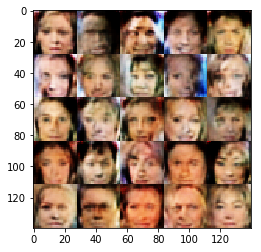

Processed 100000:  Discriminator Loss: 0.9893,  Generator Loss: 0.6991


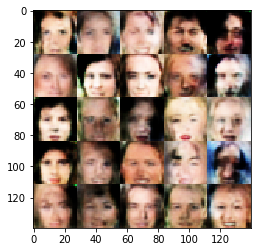

Processed 110000:  Discriminator Loss: 0.8772,  Generator Loss: 0.9078


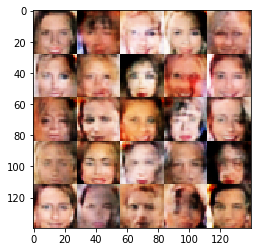

Processed 120000:  Discriminator Loss: 1.2025,  Generator Loss: 3.5126


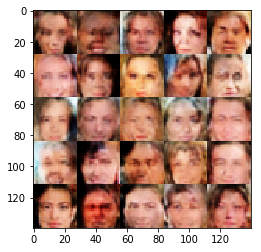

Processed 130000:  Discriminator Loss: 1.4726,  Generator Loss: 2.0056


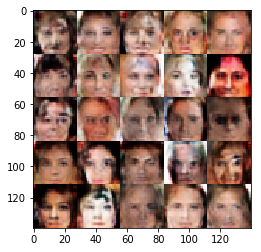

Processed 140000:  Discriminator Loss: 1.1173,  Generator Loss: 1.5495


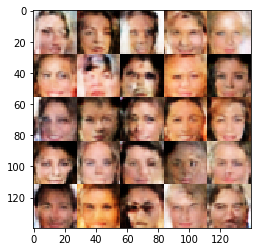

Processed 150000:  Discriminator Loss: 0.4118,  Generator Loss: 1.5720


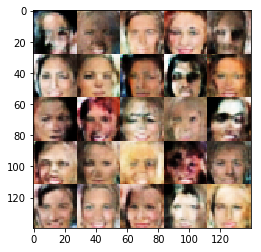

Processed 160000:  Discriminator Loss: 0.5853,  Generator Loss: 1.3781


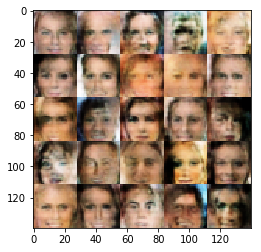

Processed 170000:  Discriminator Loss: 1.6221,  Generator Loss: 1.3967


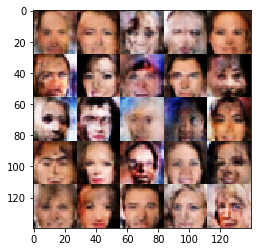

Processed 180000:  Discriminator Loss: 0.6630,  Generator Loss: 1.0480


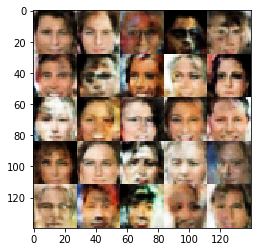

Processed 190000:  Discriminator Loss: 0.6349,  Generator Loss: 1.1695


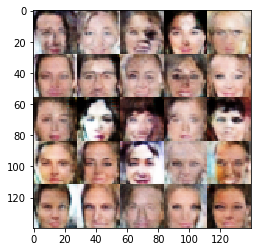

Processed 200000:  Discriminator Loss: 2.2288,  Generator Loss: 1.7099


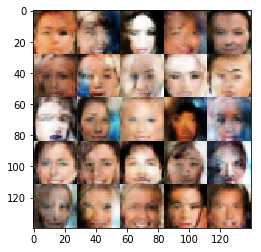

Processed 210000:  Discriminator Loss: 1.5308,  Generator Loss: 0.4695


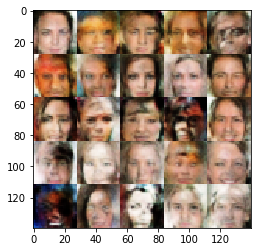

Processed 220000:  Discriminator Loss: 0.6155,  Generator Loss: 1.6473


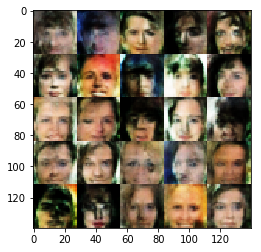

Processed 230000:  Discriminator Loss: 0.9586,  Generator Loss: 0.6705


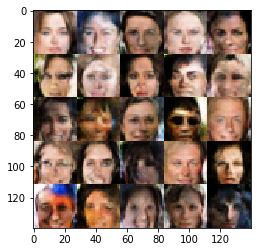

Processed 240000:  Discriminator Loss: 0.7111,  Generator Loss: 1.0529


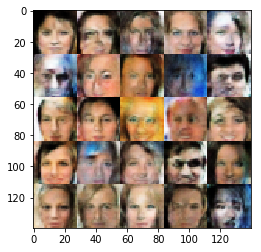

Processed 250000:  Discriminator Loss: 1.2739,  Generator Loss: 0.6347


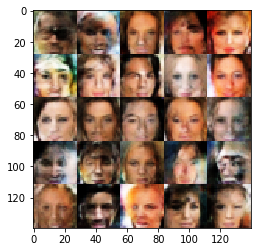

Processed 260000:  Discriminator Loss: 0.7941,  Generator Loss: 1.0589


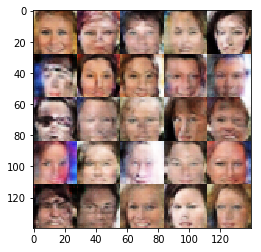

Processed 270000:  Discriminator Loss: 1.2848,  Generator Loss: 0.9269


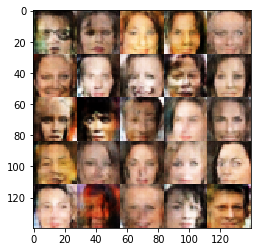

Processed 280000:  Discriminator Loss: 0.6012,  Generator Loss: 1.0293


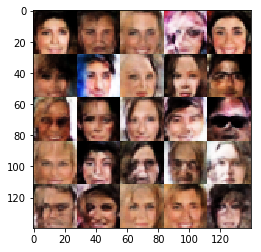

Processed 290000:  Discriminator Loss: 0.8132,  Generator Loss: 0.8562


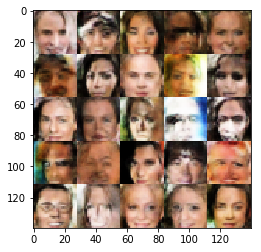

Processed 300000:  Discriminator Loss: 0.0827,  Generator Loss: 5.4376


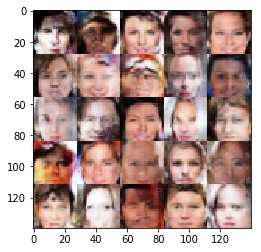

Processed 310000:  Discriminator Loss: 0.8271,  Generator Loss: 2.6660


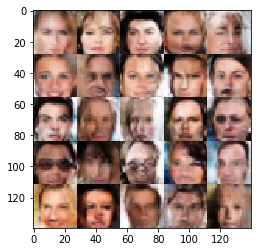

Processed 320000:  Discriminator Loss: 0.8582,  Generator Loss: 0.9094


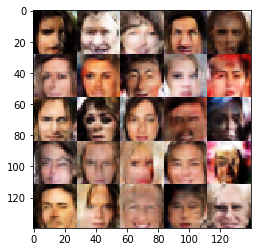

Processed 330000:  Discriminator Loss: 0.4277,  Generator Loss: 1.3658


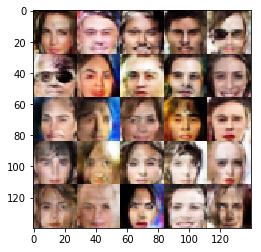

Processed 340000:  Discriminator Loss: 1.4313,  Generator Loss: 0.5577


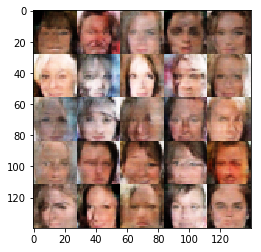

Processed 350000:  Discriminator Loss: 1.5546,  Generator Loss: 0.5224


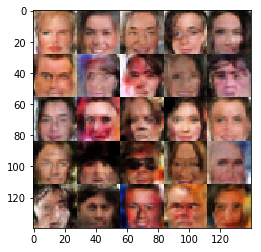

Processed 360000:  Discriminator Loss: 1.4732,  Generator Loss: 0.4866


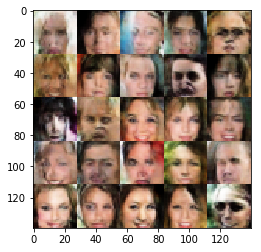

Processed 370000:  Discriminator Loss: 1.2709,  Generator Loss: 0.5750


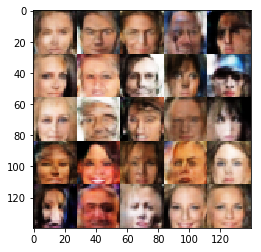

Processed 380000:  Discriminator Loss: 0.0286,  Generator Loss: 3.5321


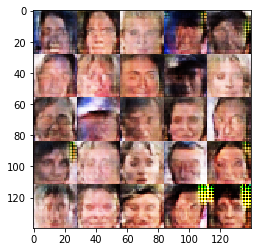

Processed 390000:  Discriminator Loss: 0.1320,  Generator Loss: 2.1886


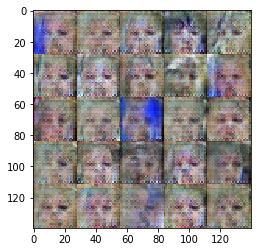

Processed 400000:  Discriminator Loss: 1.8602,  Generator Loss: 0.4739


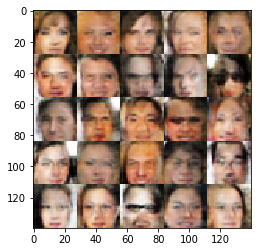

Processed 410000:  Discriminator Loss: 0.2412,  Generator Loss: 2.5331


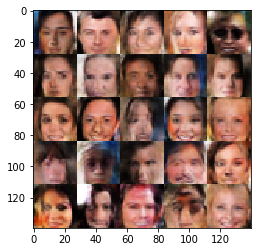

Processed 420000:  Discriminator Loss: 1.1387,  Generator Loss: 0.7007


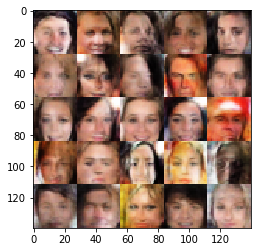

Processed 430000:  Discriminator Loss: 0.6565,  Generator Loss: 1.0220


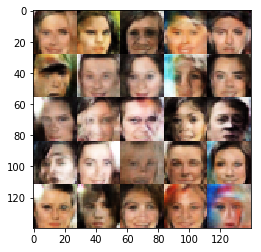

Processed 440000:  Discriminator Loss: 0.3979,  Generator Loss: 4.1216


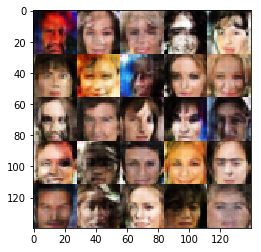

Processed 450000:  Discriminator Loss: 2.1603,  Generator Loss: 0.4185


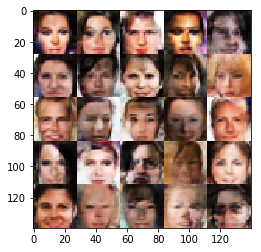

Processed 460000:  Discriminator Loss: 0.3629,  Generator Loss: 2.5672


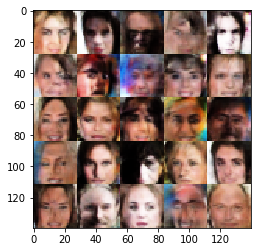

Processed 470000:  Discriminator Loss: 0.5017,  Generator Loss: 2.0012


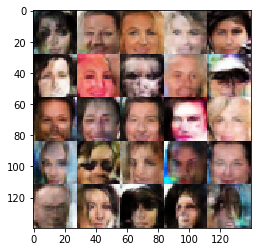

Processed 480000:  Discriminator Loss: 1.5129,  Generator Loss: 0.4860


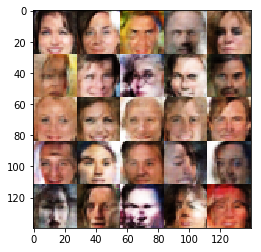

Processed 490000:  Discriminator Loss: 2.1975,  Generator Loss: 0.3723


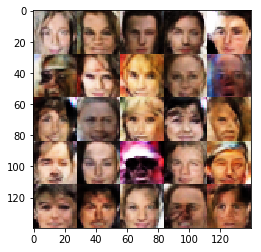

Processed 500000:  Discriminator Loss: 0.5041,  Generator Loss: 4.9808


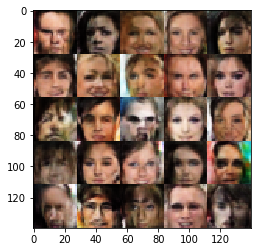

Processed 510000:  Discriminator Loss: 0.4472,  Generator Loss: 1.3005


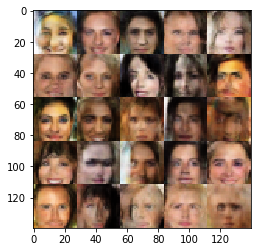

Processed 520000:  Discriminator Loss: 0.7884,  Generator Loss: 0.8247


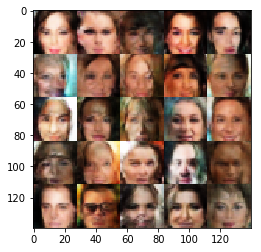

Processed 530000:  Discriminator Loss: 2.0415,  Generator Loss: 0.3636


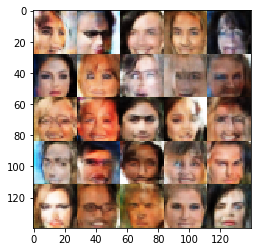

Processed 540000:  Discriminator Loss: 0.6425,  Generator Loss: 1.0216


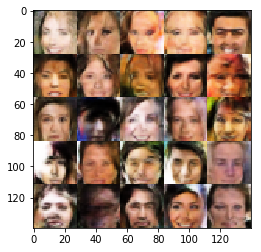

Processed 550000:  Discriminator Loss: 1.3027,  Generator Loss: 0.5694


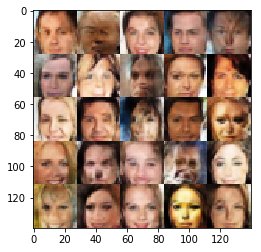

Processed 560000:  Discriminator Loss: 0.3977,  Generator Loss: 2.1803


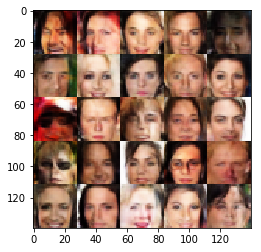

Processed 570000:  Discriminator Loss: 1.8942,  Generator Loss: 0.4086


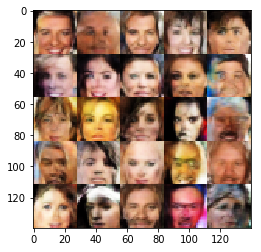

Processed 580000:  Discriminator Loss: 1.3656,  Generator Loss: 0.5088


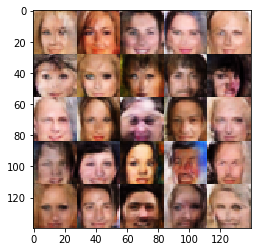

Processed 590000:  Discriminator Loss: 1.0583,  Generator Loss: 1.0507


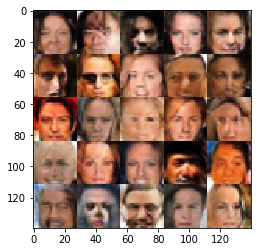

Processed 600000:  Discriminator Loss: 0.4742,  Generator Loss: 1.3419


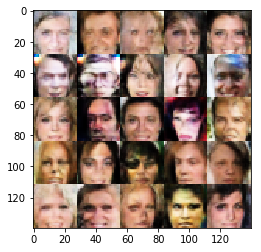

Processed 610000:  Discriminator Loss: 1.5396,  Generator Loss: 0.4559


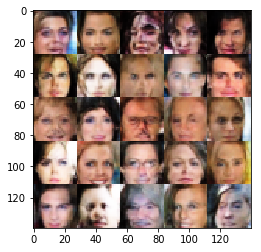

Processed 620000:  Discriminator Loss: 0.0738,  Generator Loss: 2.9858


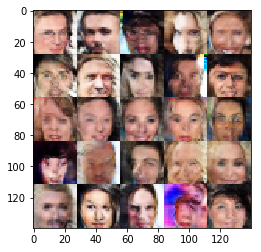

Processed 630000:  Discriminator Loss: 0.1421,  Generator Loss: 2.7201


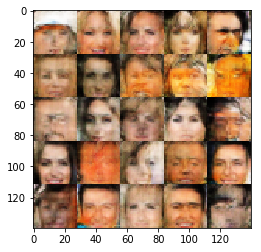

Processed 640000:  Discriminator Loss: 2.6757,  Generator Loss: 0.4830


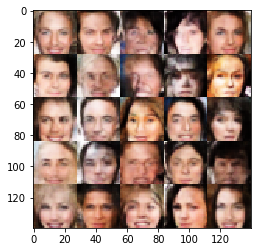

Processed 650000:  Discriminator Loss: 0.4449,  Generator Loss: 1.9164


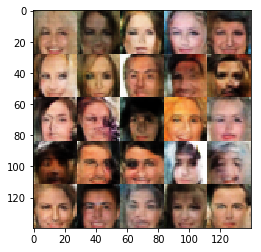

Processed 660000:  Discriminator Loss: 0.8218,  Generator Loss: 1.0822


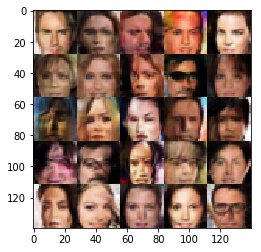

Processed 670000:  Discriminator Loss: 0.6186,  Generator Loss: 1.0886


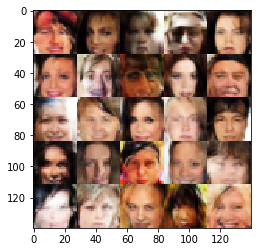

Processed 680000:  Discriminator Loss: 1.0404,  Generator Loss: 0.6930


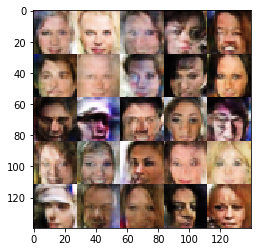

Processed 690000:  Discriminator Loss: 0.7692,  Generator Loss: 1.2060


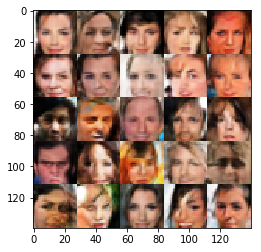

Processed 700000:  Discriminator Loss: 0.4563,  Generator Loss: 2.2975


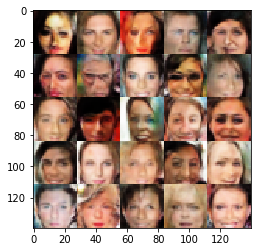

Processed 720000:  Discriminator Loss: 0.7820,  Generator Loss: 0.9517


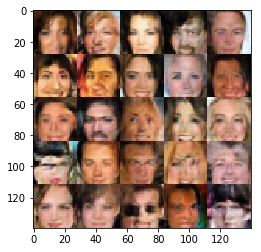

Processed 730000:  Discriminator Loss: 0.4647,  Generator Loss: 3.1027


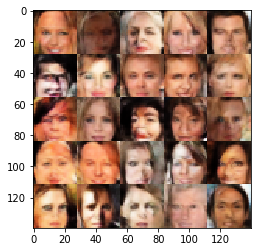

Processed 740000:  Discriminator Loss: 1.4878,  Generator Loss: 0.4914


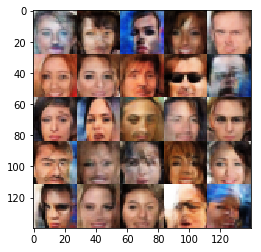

Processed 750000:  Discriminator Loss: 2.2990,  Generator Loss: 0.3598


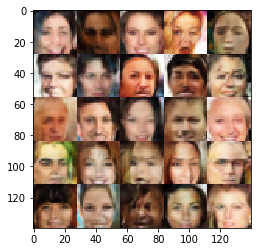

Processed 760000:  Discriminator Loss: 1.5132,  Generator Loss: 0.5171


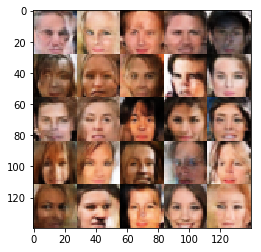

Processed 770000:  Discriminator Loss: 1.1780,  Generator Loss: 1.2860


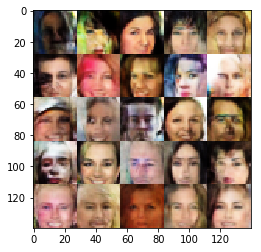

Processed 780000:  Discriminator Loss: 0.5299,  Generator Loss: 1.6264


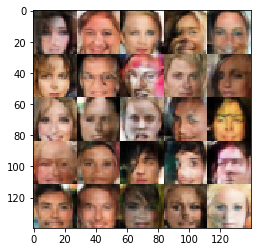

Processed 790000:  Discriminator Loss: 1.0984,  Generator Loss: 0.6224


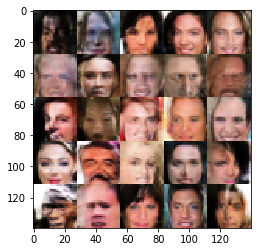

Processed 800000:  Discriminator Loss: 1.4644,  Generator Loss: 0.5214


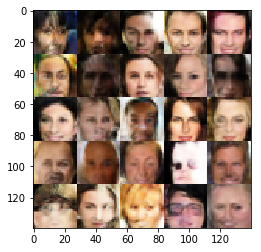

Processed 810000:  Discriminator Loss: 1.5986,  Generator Loss: 1.5906


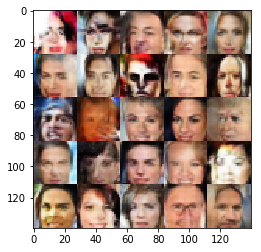

Processed 820000:  Discriminator Loss: 0.6818,  Generator Loss: 1.4748


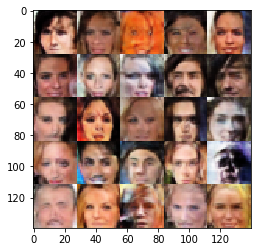

Processed 830000:  Discriminator Loss: 1.7212,  Generator Loss: 0.5058


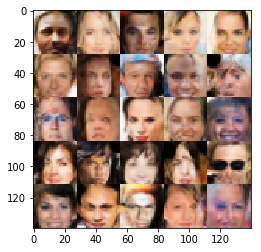

Processed 840000:  Discriminator Loss: 0.5547,  Generator Loss: 1.2363


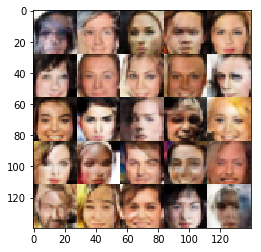

Processed 850000:  Discriminator Loss: 0.5125,  Generator Loss: 3.9890


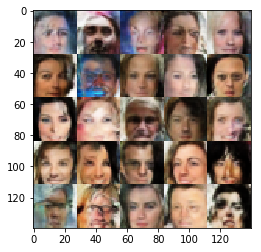

Processed 860000:  Discriminator Loss: 1.4239,  Generator Loss: 0.5526


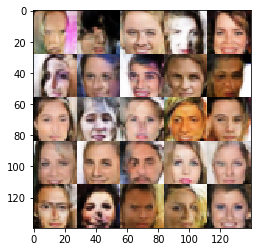

Processed 870000:  Discriminator Loss: 0.8201,  Generator Loss: 1.0240


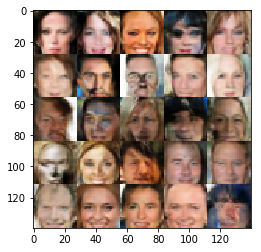

Processed 880000:  Discriminator Loss: 1.6016,  Generator Loss: 0.4875


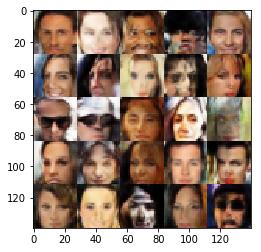

Processed 890000:  Discriminator Loss: 1.1792,  Generator Loss: 0.7851


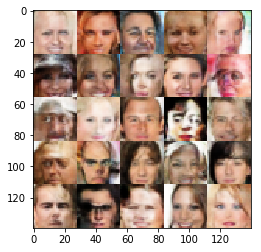

Processed 900000:  Discriminator Loss: 1.0908,  Generator Loss: 0.9097


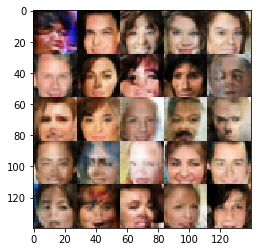

Processed 910000:  Discriminator Loss: 1.0076,  Generator Loss: 0.7192


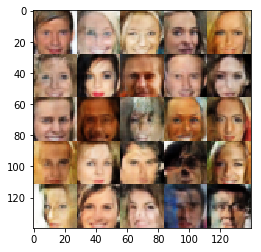

Processed 920000:  Discriminator Loss: 1.1323,  Generator Loss: 0.5931


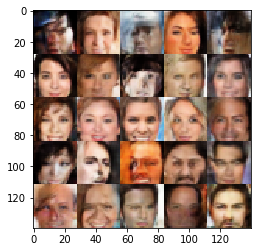

Processed 930000:  Discriminator Loss: 1.3512,  Generator Loss: 0.5189


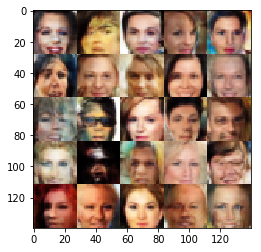

Processed 940000:  Discriminator Loss: 1.7943,  Generator Loss: 0.4002


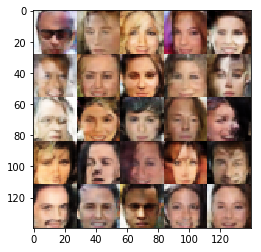

Processed 950000:  Discriminator Loss: 0.6787,  Generator Loss: 1.8435


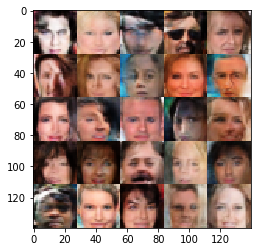

Processed 960000:  Discriminator Loss: 1.0931,  Generator Loss: 0.7558


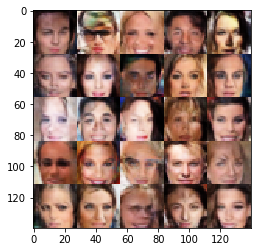

Processed 970000:  Discriminator Loss: 1.2079,  Generator Loss: 1.4376


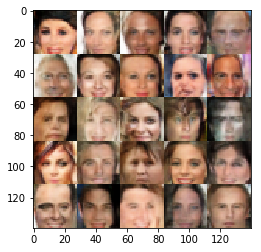

Processed 980000:  Discriminator Loss: 1.9518,  Generator Loss: 0.3855


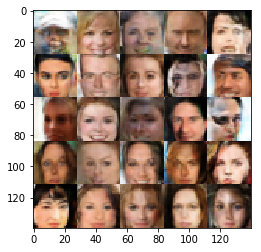

Processed 990000:  Discriminator Loss: 0.1260,  Generator Loss: 2.7368


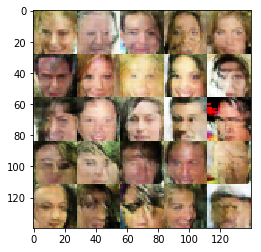

Processed 1000000:  Discriminator Loss: 1.0037,  Generator Loss: 0.7593


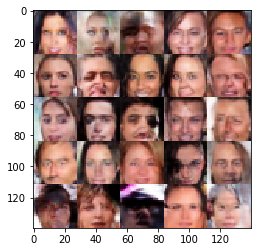

Processed 1010000:  Discriminator Loss: 1.5236,  Generator Loss: 0.4399


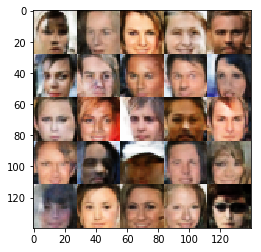

Processed 1020000:  Discriminator Loss: 1.6210,  Generator Loss: 0.4358


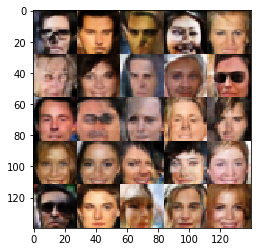

Processed 1030000:  Discriminator Loss: 1.3396,  Generator Loss: 1.1747


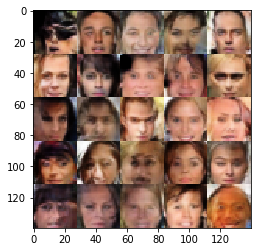

Processed 1040000:  Discriminator Loss: 2.0954,  Generator Loss: 0.3616


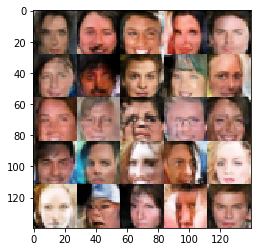

Processed 1050000:  Discriminator Loss: 0.8949,  Generator Loss: 0.8299


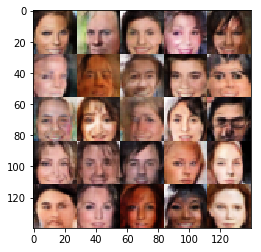

Processed 1060000:  Discriminator Loss: 0.0278,  Generator Loss: 3.8691


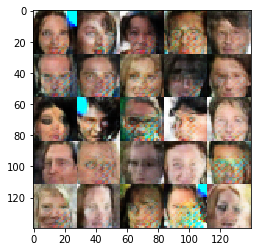

Processed 1070000:  Discriminator Loss: 0.1124,  Generator Loss: 2.6833


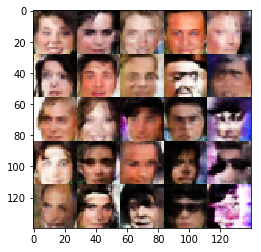

Processed 1080000:  Discriminator Loss: 0.8810,  Generator Loss: 1.6393


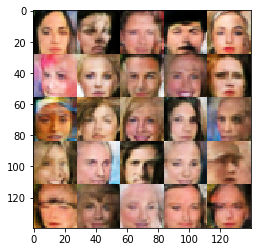

Processed 1090000:  Discriminator Loss: 1.7466,  Generator Loss: 0.4320


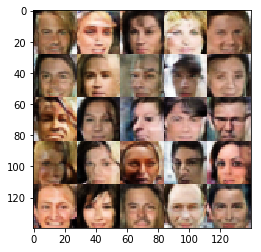

Processed 1100000:  Discriminator Loss: 1.4310,  Generator Loss: 0.5299


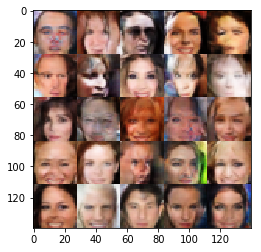

Processed 1110000:  Discriminator Loss: 0.9509,  Generator Loss: 0.9136


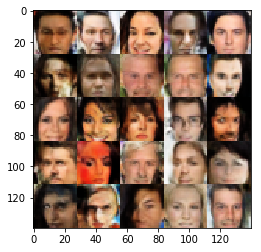

Processed 1120000:  Discriminator Loss: 1.8828,  Generator Loss: 0.4069


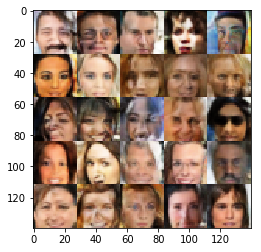

Processed 1130000:  Discriminator Loss: 1.5372,  Generator Loss: 0.4957


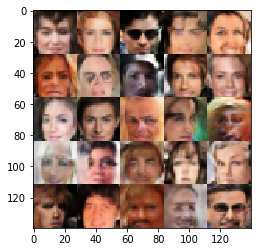

Processed 1140000:  Discriminator Loss: 1.0352,  Generator Loss: 0.8920


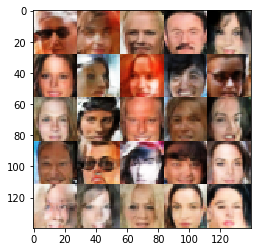

Processed 1150000:  Discriminator Loss: 1.3017,  Generator Loss: 0.5708


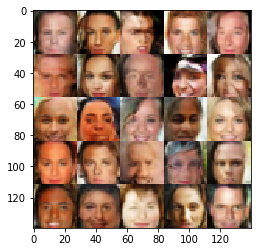

Processed 1160000:  Discriminator Loss: 1.6654,  Generator Loss: 0.4261


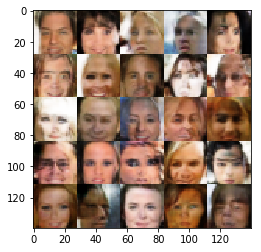

Processed 1170000:  Discriminator Loss: 0.6332,  Generator Loss: 1.3599


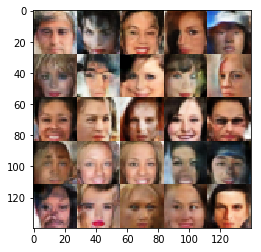

Processed 1180000:  Discriminator Loss: 1.6108,  Generator Loss: 0.4514


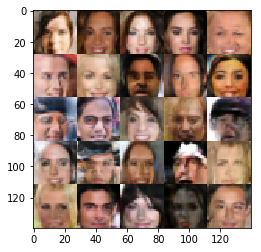

Processed 1190000:  Discriminator Loss: 0.8526,  Generator Loss: 0.8861


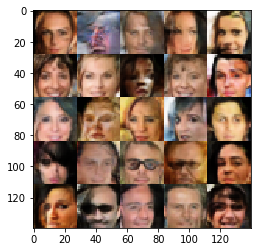

Processed 1200000:  Discriminator Loss: 1.5157,  Generator Loss: 0.4912


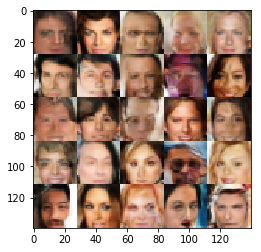

Processed 1210000:  Discriminator Loss: 1.3556,  Generator Loss: 0.4926


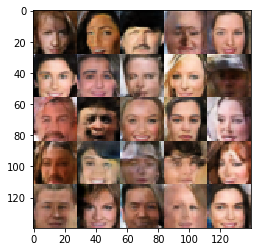

Processed 1220000:  Discriminator Loss: 0.7840,  Generator Loss: 0.9381


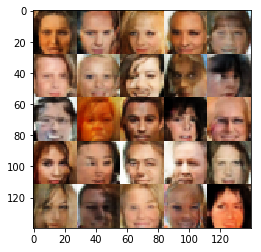

Processed 1230000:  Discriminator Loss: 1.7424,  Generator Loss: 0.4354


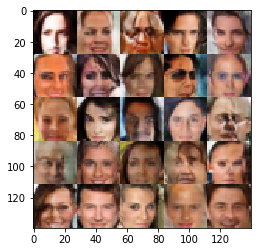

Processed 1240000:  Discriminator Loss: 1.7970,  Generator Loss: 0.4342


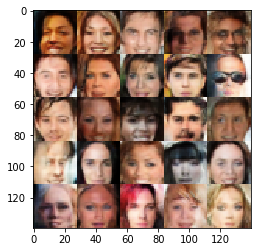

Processed 1250000:  Discriminator Loss: 2.1501,  Generator Loss: 0.3799


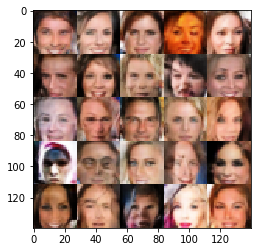

Processed 1260000:  Discriminator Loss: 1.5198,  Generator Loss: 0.4937


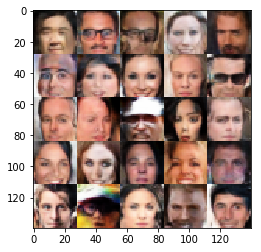

Processed 1270000:  Discriminator Loss: 0.3689,  Generator Loss: 2.3222


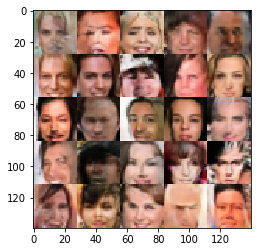

Processed 1280000:  Discriminator Loss: 1.2764,  Generator Loss: 0.6905


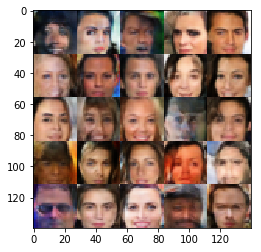

Processed 1290000:  Discriminator Loss: 1.4916,  Generator Loss: 0.5881


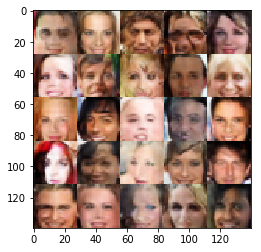

Processed 1300000:  Discriminator Loss: 1.7522,  Generator Loss: 0.4548


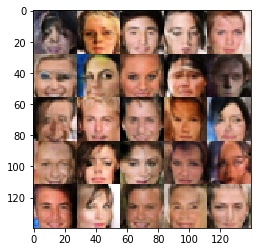

Processed 1310000:  Discriminator Loss: 0.8490,  Generator Loss: 1.1271


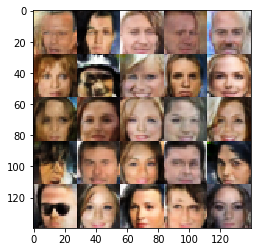

Processed 1320000:  Discriminator Loss: 1.0585,  Generator Loss: 0.6857


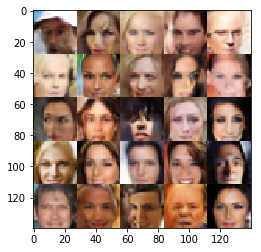

Processed 1330000:  Discriminator Loss: 0.0677,  Generator Loss: 8.8853


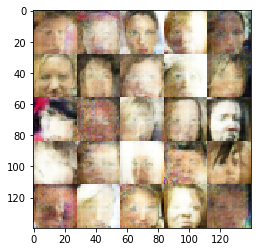

Processed 1340000:  Discriminator Loss: 0.0910,  Generator Loss: 2.7149


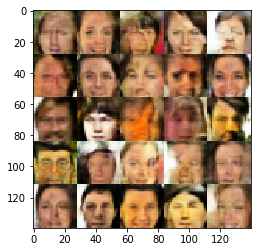

Processed 1350000:  Discriminator Loss: 0.9204,  Generator Loss: 1.5562


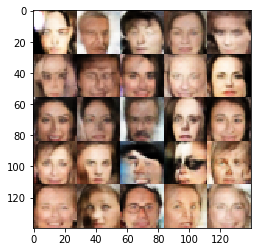

Processed 1360000:  Discriminator Loss: 1.4650,  Generator Loss: 0.5057


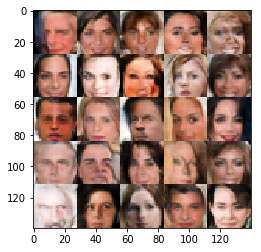

Processed 1370000:  Discriminator Loss: 1.3495,  Generator Loss: 0.5964


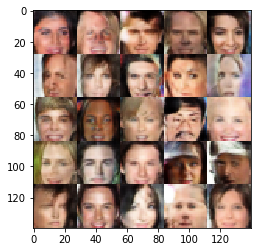

Processed 1380000:  Discriminator Loss: 1.6975,  Generator Loss: 0.4385


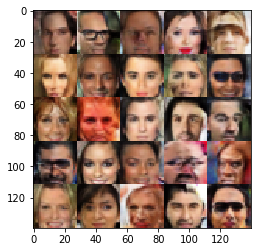

Processed 1390000:  Discriminator Loss: 1.2670,  Generator Loss: 2.8594


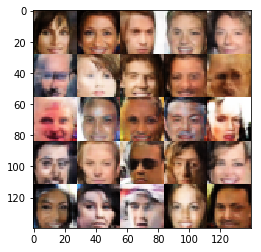

Processed 1400000:  Discriminator Loss: 1.1706,  Generator Loss: 0.7527


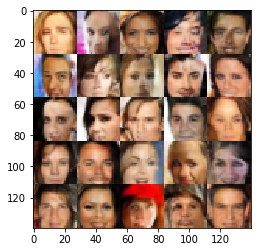

Processed 1410000:  Discriminator Loss: 0.7122,  Generator Loss: 1.0937


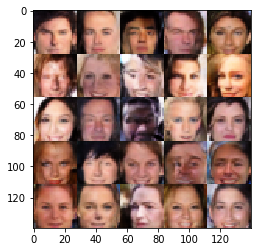

Processed 1420000:  Discriminator Loss: 1.3126,  Generator Loss: 0.6833


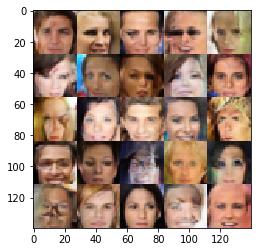

Processed 1430000:  Discriminator Loss: 1.0641,  Generator Loss: 0.7365


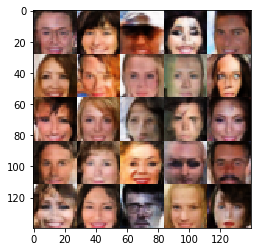

In [ ]:
batch_size = 100
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.